Pneumonia is an inflammatory condition of the lung mainly affecting the small air sacs called **alveoli**. It is an infectious and fatal respiratory disease caused by bacteria, fungi, or a virus that infects human lung air sacs with a load full of fluid or pus.

Chest x-rays are the common method used to diagnose pneumonia and it takes a medical expert to assess the result of the x-ray. The troublesome method of detecting pneumonia leads to loss of life due to improper diagnosis and treatment.

With the emerging computing power, the development of an automatic pneumonia detection and disease treatment system is now possible, especially if the patient is in a remote area and medical services are limited.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


We will use the [Fastai](https://en.wikipedia.org/wiki/Fast.ai) library in Python for the task of Pneumonia Detection.

In [2]:
# !pip install fastai
# !pip install -Uqq fastbook

In [3]:
# import fastbook
# fastbook.setup_book()

In [4]:
import fastai
import fastai.vision
from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate
import os
import pandas as pd
import numpy as np

In [5]:
fastai.__version__

'1.0.61'

In [6]:
# dir(fastai.vision.all.aug_transforms)
# dir(fastai.vision.all.ImageDataLoaders)

Now we need to set up the path for training dataset as the dataset includes images only:

In [7]:
from pathlib import Path

In [8]:
x  = '/content/drive/MyDrive/chest_xray'
path = Path(x)
path.ls()

[PosixPath('/content/drive/MyDrive/chest_xray/test'),
 PosixPath('/content/drive/MyDrive/chest_xray/val'),
 PosixPath('/content/drive/MyDrive/chest_xray/train')]

Now let’s load the data for training or Machine Learning model for Pneumonia Detection:

In [9]:
np.random.seed(40)
data = ImageDataBunch.from_folder(path, train = '.', valid_pct=0.2,
                                  ds_tfms=get_transforms(), size=224,
                                  num_workers=4).normalize(imagenet_stats)

/usr/local/lib/python3.7/dist-packages/fastai/vision/transform.py:247: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  return _solve_func(B,A)[0][:,0]
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 


### Data Exploration

The dataset we’re using here is stored as `.jpg files` in 2 different folders, each folder with the model name of the images in the folder.

We need to use the `ImageDataBunch.from_folder()` function to load the images and assign tags to the images based on the name of the folder from which they are read:

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale

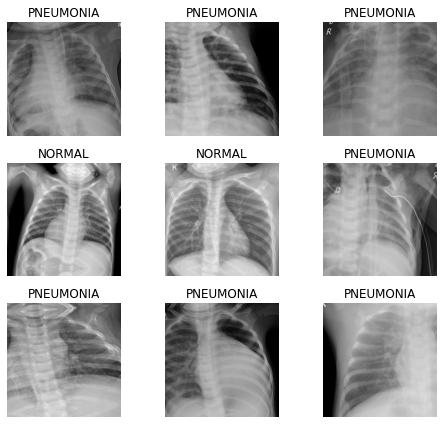

In [10]:
data.show_batch(rows=3, figsize=(7,6),recompute_scale_factor=True)

Now, we will use a pre-trained model known as **ResNet50**, which is a type of Convolutional Neural network in Machine Learning.

In [11]:
learn = cnn_learner(data, models.resnet50, metrics=[accuracy], model_dir = Path('Path'),path = Path("."))

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Let’s have a look at the learning rate of the model:

In [12]:
learn.lr_find()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


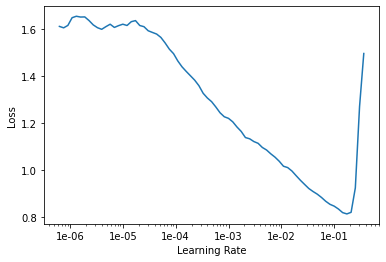

In [13]:
learn.recorder.plot(suggestions=True)

### Training and Testing the Model 
Above, we loaded the model. Now we will train the model on our dataset:

In [14]:
lr1 = 1e-3
lr2 = 1e-1
learn.fit_one_cycle(4,slice(lr1,lr2))

epoch,train_loss,valid_loss,accuracy,time
0,0.618734,0.737949,0.909710,07:39
1,0.342127,1.024391,0.791312,06:09
2,0.196682,0.107589,0.966780,06:13
3,0.116196,0.119171,0.959966,06:11


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

In [15]:
# lr1 = 1e-3
lr = 1e-1
learn.fit_one_cycle(20,slice(lr))

learn.unfreeze()

epoch,train_loss,valid_loss,accuracy,time
0,0.076611,0.120729,0.957411,05:52
1,0.085859,0.110882,0.963373,06:02
2,0.153682,1.762401,0.780239,06:08
3,0.246154,0.197973,0.958262,06:10
4,0.358236,0.772330,0.839864,06:06
5,0.299951,1.664996,0.403748,06:10
6,0.230796,0.146614,0.957411,06:09
7,0.176840,0.190258,0.959114,06:10
8,0.303240,0.456769,0.946337,06:09
9,0.281128,0.196210,0.957411,06:11


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

In [16]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,time


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


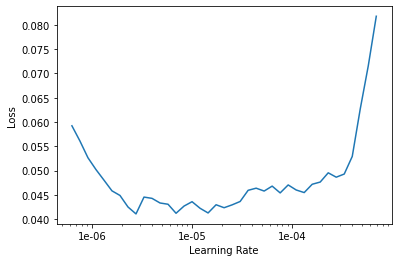

In [17]:
learn.recorder.plot()

In [18]:
learn.fit_one_cycle(10,slice(1e-4,1e-3))

epoch,train_loss,valid_loss,accuracy,time
0,0.056181,0.262654,0.930153,06:03
1,0.088912,1.257152,0.770017,06:10
2,0.098551,0.151015,0.957411,06:17
3,0.085254,0.126380,0.958262,06:13
4,0.087101,0.557207,0.873083,06:12
5,0.073761,0.074627,0.970187,06:16
6,0.071975,0.066592,0.975298,06:13
7,0.056577,0.125221,0.959114,06:13
8,0.049459,0.270890,0.968484,06:10
9,0.047361,0.087160,0.968484,06:13


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default

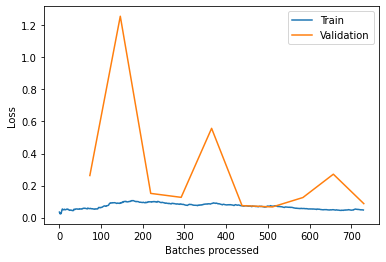

In [19]:
learn.recorder.plot_losses()

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
/usr/local/lib/python3.7/dist-packa

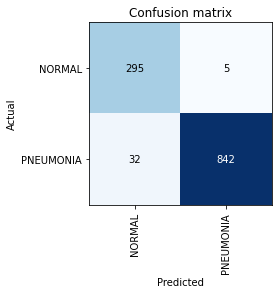

In [20]:
# let’s test the model:

interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

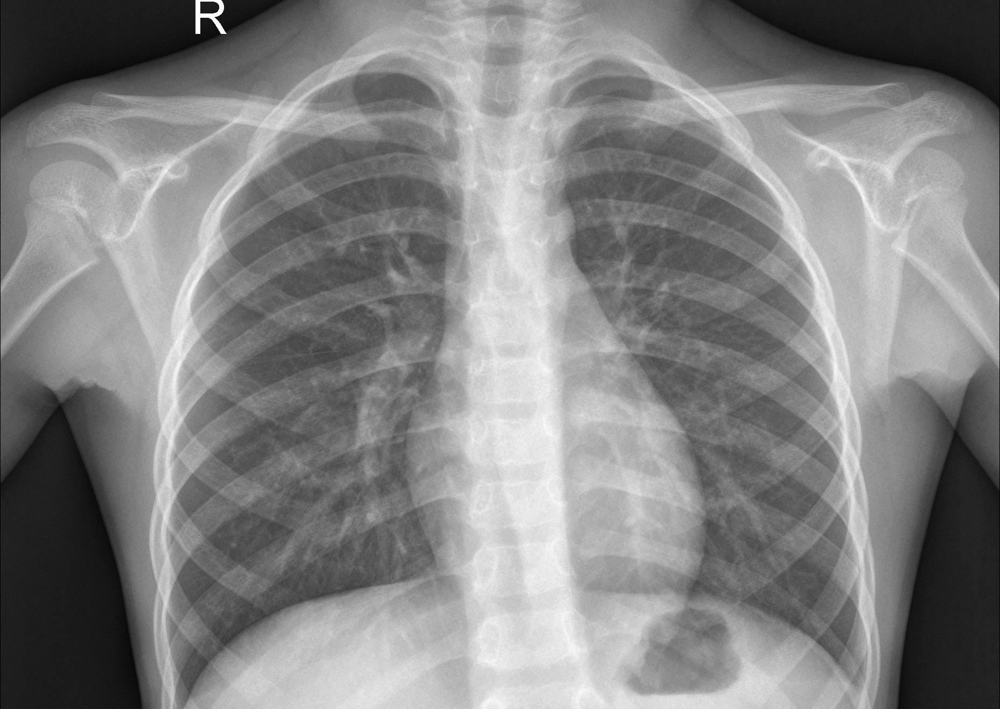

In [26]:
img = open_image('/content/drive/MyDrive/chest_xray/test/NORMAL/IM-0001-0001.jpeg')
img

In [27]:
learn.predict(img)[0]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "


Category tensor(0)